<a href="https://colab.research.google.com/github/miya498/petbottle_detection/blob/master/YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **YOLOv8を用いたペットボトルごみ検証モデル**

**＜実行環境＞**

実行環境は、無料版colaboratoryを使用していたが、学習の段階でGPUの使用制限を頻繫に受けてしまった。そのため、途中からはcolaboratoryProにアップグレードしている。また、学習用データセットの保存、モデルの保存、出力結果など全てをGoogleDrive上で行っており、Drive容量も20GBから100GBのものに変更。

**＜学習用データセット＞**

YOLOの学習において画像以外にアノテーションデータも必要となる。アノテーションデータは「LabelImg」というアノテーション専用のソフトを用いて行った。

*[Github]：https://github.com/tzutalin/labelImg
学習データは自ら収集した画像とインターネット上の画像を合わせて267枚用意した。
(水増しなしのデータ)

またこの画像データを縮小し回転した画像をプログラムで出力し、1枚の画像から4枚の水増し画像を得た。これによって267×5=1335枚のデータセットを別に用意した。(水増しありのデータセット)

**＜学習済みモデル＞**

driveからダウンロードしてください

*[yolov8x_pet_914.pt]:水増しなしのデータセットで学習(epoch=914)

https://drive.google.com/file/d/1U5aFFSgiks1iPuA3sEQPBJCwwHogAu7M/view?usp=sharing

*[yolov8x_pet_250.pt]:水増しありのデータセットで学習(epoch=250)

https://drive.google.com/file/d/1wOkVHyQ2BJj7c50zZ9LPbZ-kg1h4Mtx5/view?usp=sharing

In [ ]:
#googledriveに接続
import google.colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#clone
%cd /content/drive/MyDrive/
# Git clone method (for development)
!git clone https://github.com/ultralytics/ultralytics
%pip install -qe ultralytics

/content/drive/MyDrive
fatal: destination path 'ultralytics' already exists and is not an empty directory.
  Preparing metadata (setup.py) ... done


#サンプル画像で確認

In [ ]:
!yolo task=detect mode=predict model=yolov8n.pt \
    source="https://ultralytics.com/images/bus.jpg"

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla V100-SXM2-16GB, 16151MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs

100% 476k/476k [00:00<00:00, 27.0MB/s]
image 1/1 /content/drive/MyDrive/bus.jpg: 640x480 4 persons, 1 bus, 1 stop sign, 85.4ms
Speed: 18.1ms preprocess, 85.4ms inference, 47.3ms postprocess per image at shape (1, 3, 640, 480)
Results saved to /content/drive/MyDrive/ultralytics/runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


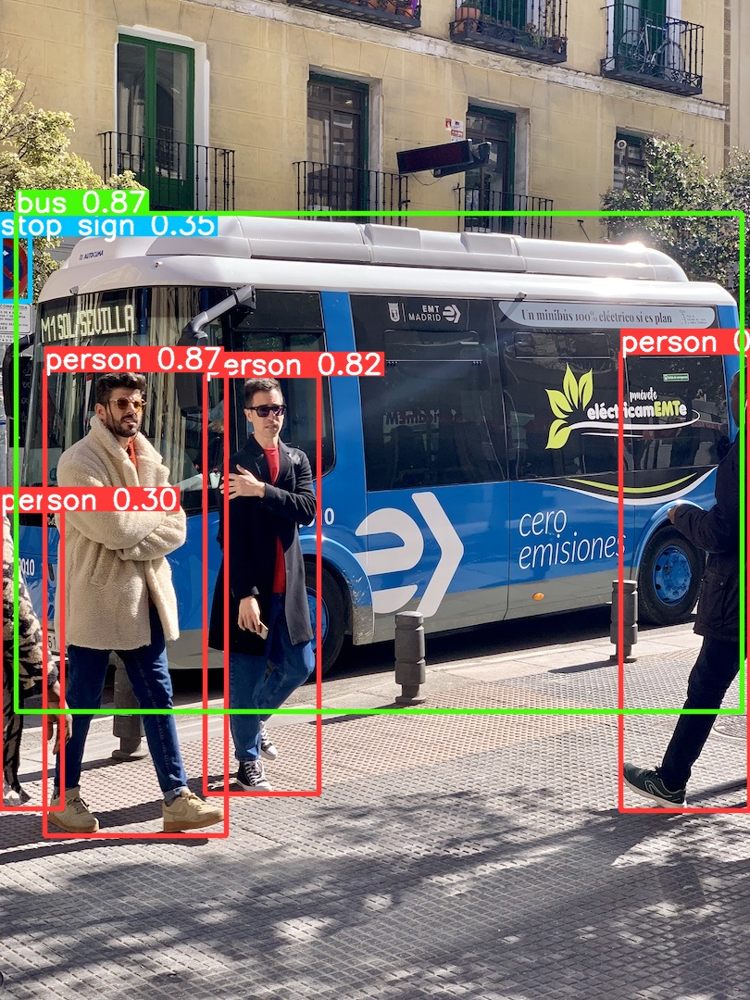

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/ultralytics/runs/detect/predict/bus.jpg")

#学習開始

data="yamlファイルのパス" を指定

In [ ]:
# Train YOLOv8n
#水増しなし　/Petbottle/petbottle.yaml
#水増しあり  /Petbottle_fake/petbottle_fake.yaml
!yolo task=detect mode=train model=yolov8x.pt data="/content/drive/MyDrive/Petbottle_fake/petbottle_fake.yaml" epochs=250 batch=8 imgsz=640

New https://pypi.org/project/ultralytics/8.0.231 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8x.pt, data=/content/drive/MyDrive/Petbottle_fake/petbottle_fake.yaml, epochs=250, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_w

#学習済みモデルを使って検証

model="学習済みモデルのパス"、
source="検出したい画像のパス"を指定

In [ ]:
!yolo task=detect mode=predict model="/content/drive/MyDrive/ultralytics/runs/detect/nf_yolov8x_914/weights/best.pt" \
    source="/content/drive/MyDrive/yolov5/data/images/sample05.jpg" \
    save_txt=True

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 268 layers, 68126457 parameters, 0 gradients, 257.4 GFLOPs

image 1/1 /content/drive/MyDrive/yolov5/data/images/sample05.jpg: 480x640 2 caps, 2 labels, 3 petbottles, 3566.7ms
Speed: 19.6ms preprocess, 3566.7ms inference, 34.8ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/drive/MyDrive/ultralytics/runs/detect/predict
1 label saved to /content/drive/MyDrive/ultralytics/runs/detect/predict/labels
💡 Learn more at https://docs.ultralytics.com/modes/predict


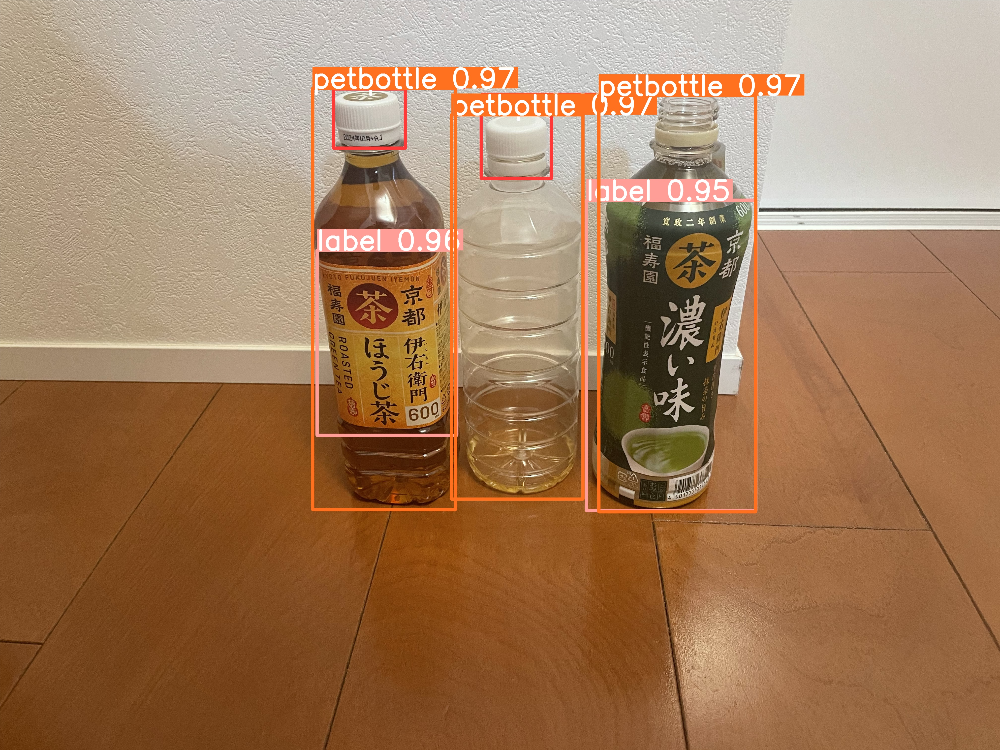

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/ultralytics/runs/detect/predict/sample05.jpg")

In [ ]:
!yolo task=detect mode=predict model="/content/drive/MyDrive/ultralytics/runs/detect/fa_yolov8x_250/weights/best.pt" \
    source="/content/drive/MyDrive/yolov5/data/images/sample05.jpg" \
    save_txt=True

Ultralytics YOLOv8.0.211 🚀 Python-3.10.12 torch-2.1.0+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 268 layers, 68126457 parameters, 0 gradients, 257.4 GFLOPs

image 1/1 /content/drive/MyDrive/yolov5/data/images/sample05.jpg: 480x640 2 caps, 2 labels, 3 petbottles, 3475.4ms
Speed: 6.0ms preprocess, 3475.4ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/drive/MyDrive/ultralytics/runs/detect/predict2
1 label saved to /content/drive/MyDrive/ultralytics/runs/detect/predict2/labels
💡 Learn more at https://docs.ultralytics.com/modes/predict


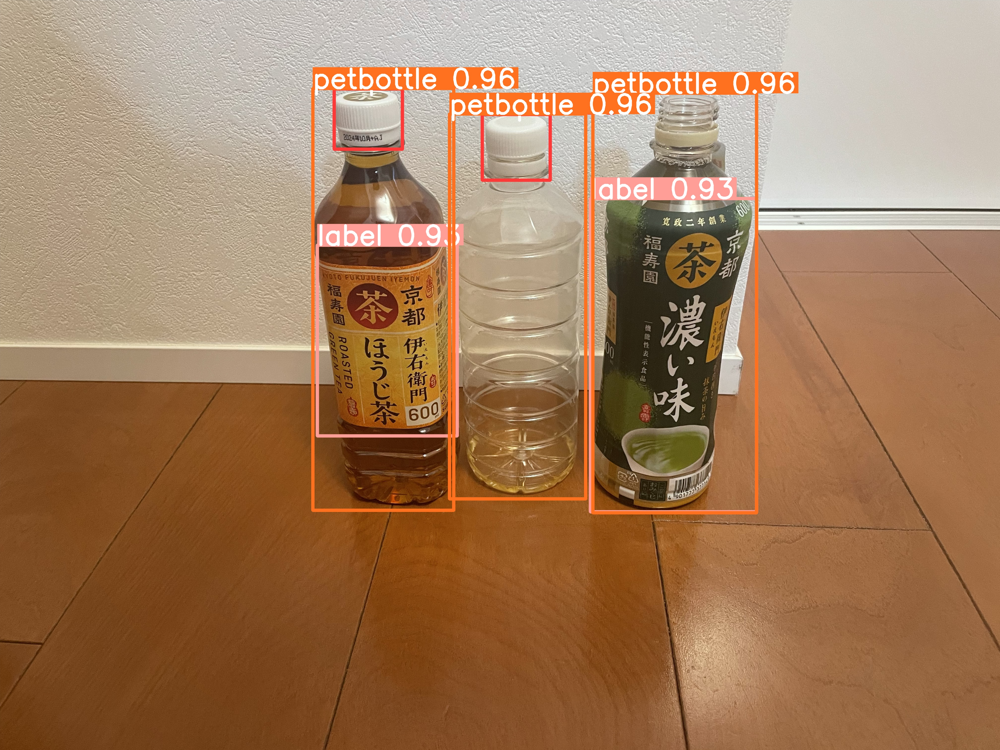

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/ultralytics/runs/detect/predict2/sample05.jpg")